https://infercnvpy.readthedocs.io/en/latest/notebooks/tutorial_3k.html
# CNV analysis

In [38]:
import os
import scanpy as sc
import infercnvpy as cnv
import matplotlib.pyplot as plt
import pandas as pd
import warnings
import numpy as np
import seaborn as sns
from pyensembl import EnsemblRelease
from matplotlib.backends.backend_pdf import PdfPages
import scipy.sparse

warnings.simplefilter("ignore")

sc.settings.set_figure_params(figsize=(5, 5))

data_path = "./data/"
graphics_path = "./graphics"

os.makedirs(f"{graphics_path}/CNV", exist_ok=True)

In [2]:
data_path = "./data/"
adata_annotated = sc.read_h5ad(os.path.join(data_path, "adata_annotated_full.h5ad"))

In [ ]:
# Load EnsemblRelease for GRCh38

data = EnsemblRelease(110)

adata_annotated.var["gene_names"] = adata_annotated.var.index
#adata_annotated.var.set_index("gene_ids", inplace=True)

adata_annotated.var.set_index('gene_ids', inplace=True)

unmatched_genes = []

for gene_id in adata_annotated.var.index:
    try:
        gene = data.gene_by_id(gene_id)
        
        adata_annotated.var.at[gene_id, "chromosome"] = f"chr{gene.contig}"
        adata_annotated.var.at[gene_id, "start"] = gene.start
        adata_annotated.var.at[gene_id, "end"] = gene.end
    except Exception as e:
        unmatched_genes.append(gene_id)

print(f"Unmatched genes: {len(unmatched_genes)}")
print(adata_annotated.var[["chromosome", "start", "end"]].head())

Unmatched genes: 401
                chromosome    start       end
gene_ids                                     
ENSG00000243485       chr1  29554.0   31109.0
ENSG00000237613       chr1  34554.0   36081.0
ENSG00000186092       chr1  65419.0   71585.0
ENSG00000238009       chr1  89295.0  133723.0
ENSG00000239945       chr1  89551.0   91105.0


In [4]:
adata_annotated.obs["cell_type"] = adata_annotated.obs["manual_annotation"]
print(adata_annotated.obs["cell_type"].value_counts())

cell_type
NK cells                         8777
Monocytes                        8187
T cells                          4586
Anti-inflammatory macrophages    3439
mo-DC2                           3246
Macrophages                      2949
Mature B cells                   2264
Mast cells                       1927
Plasma B cells                   1300
cDC2                              935
SPP1+ TAM macrophages             778
CAML                              325
None                              216
mature DC                         166
Name: count, dtype: int64


In [5]:
adata_annotated.var["chromosome"].unique()

array(['chr1', nan, 'chr2', 'chr3', 'chr4', 'chr5', 'chr6', 'chr7',
       'chrX', 'chr8', 'chr9', 'chr11', 'chr10', 'chr12', 'chr13',
       'chr14', 'chr15', 'chr16', 'chr17', 'chr18', 'chr20', 'chr19',
       'chrY', 'chr22', 'chr21', 'chrMT', 'chrKI270728.1',
       'chrKI270727.1', 'chrGL000009.2', 'chrGL000194.1', 'chrGL000195.1',
       'chrGL000219.1', 'chrKI270734.1', 'chrGL000213.1', 'chrGL000218.1',
       'chrKI270731.1', 'chrKI270721.1', 'chrKI270726.1', 'chrKI270711.1',
       'chrKI270713.1'], dtype=object)

Processing Patient 7...



  0%|          | 0/2 [00:00<?, ?it/s]

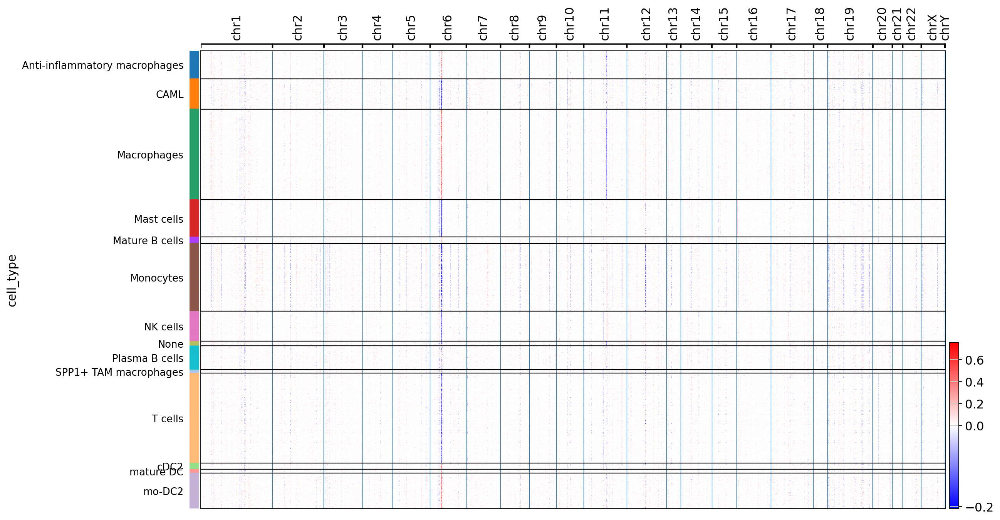

Processing Patient 9...



  0%|          | 0/16 [00:00<?, ?it/s]

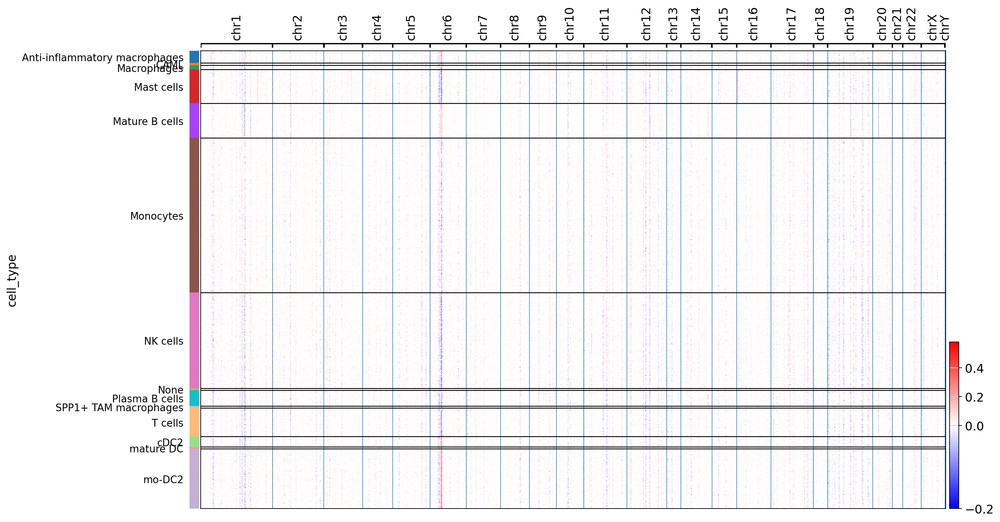

Processing Patient 6...



  0%|          | 0/4 [00:00<?, ?it/s]

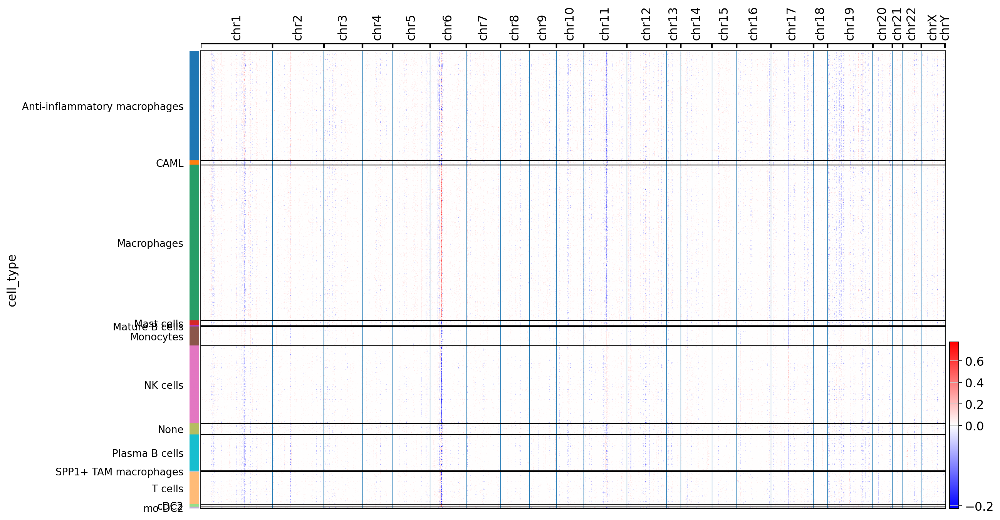

Processing Patient 5...



  0%|          | 0/5 [00:00<?, ?it/s]

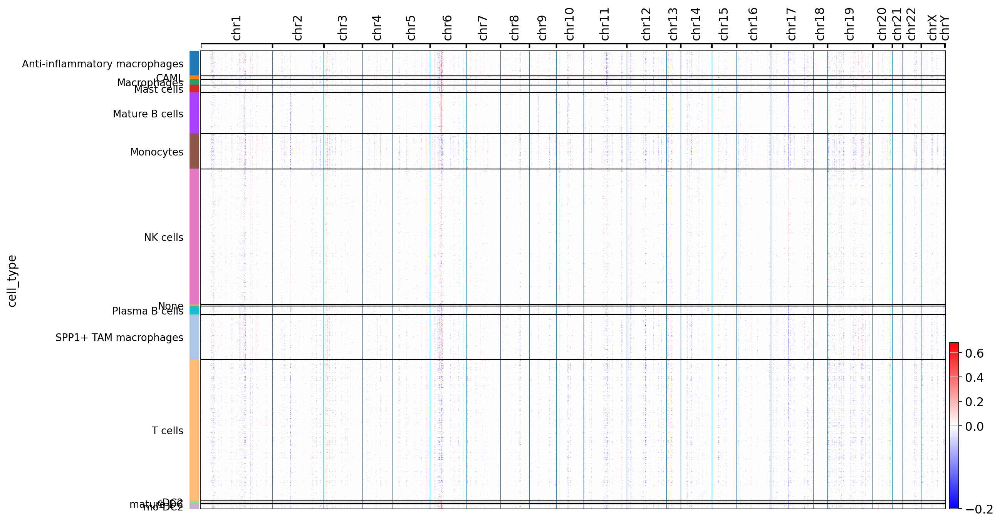

Processing Patient 10...



  0%|          | 0/4 [00:00<?, ?it/s]

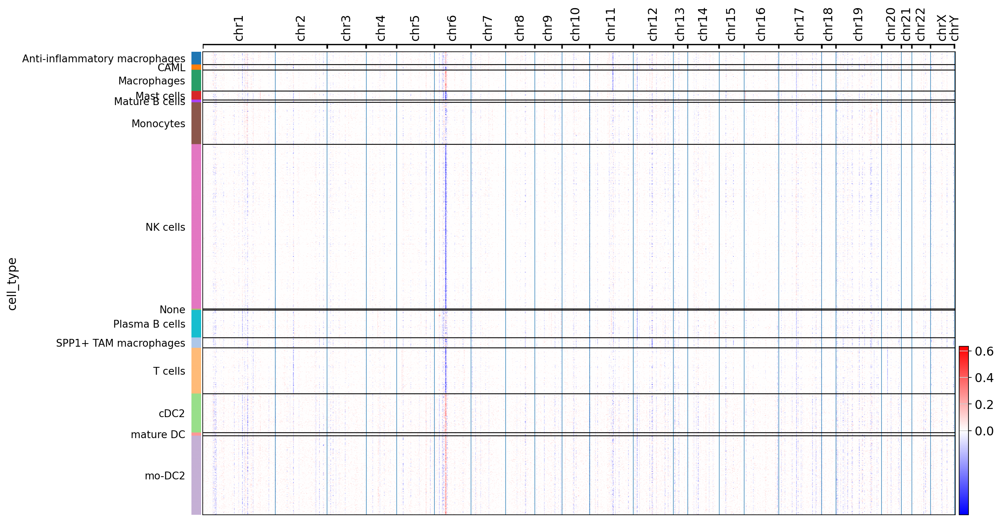

Processing Patient 13...



  0%|          | 0/10 [00:00<?, ?it/s]

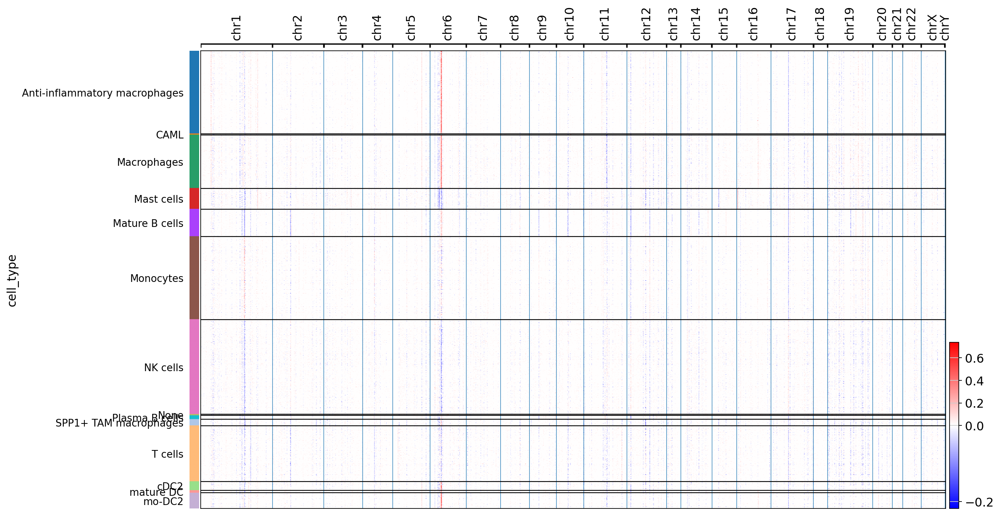

In [41]:
# Calculate mean gene expression in cells sampled in healthy tissue (background) for reference

cnv_results = {}
cnv_metadata = {}

for patient in adata_annotated.obs["Patient"].unique():

    print(f"Processing {patient}...\n")
    adata_subset = adata_annotated[adata_annotated.obs["Patient"]==patient]

    adata_reference = adata_subset[adata_subset.obs["Sampling site"] != "tumor"]
    reference_array = np.mean(adata_reference.X, axis=0)

    cnv.tl.infercnv(
        adata_subset,
        window_size=50,
        reference=reference_array,
        exclude_chromosomes=('chrMT', 'chrKI270728.1', 'chrKI270727.1', 'chrGL000009.2', 'chrGL000194.1', 'chrGL000195.1',
        'chrGL000219.1', 'chrKI270734.1', 'chrGL000213.1', 'chrGL000218.1', 'chrKI270731.1', 'chrKI270721.1', 'chrKI270726.1', 'chrKI270711.1', 'chrKI270713.1'),
        chunksize=1000)
    
    cnv_results[patient] = adata_subset.obsm["X_cnv"]
    cnv_metadata[patient] = adata_subset.uns["cnv"]

    cnv.pl.chromosome_heatmap(adata_subset, groupby="cell_type")


In [42]:
# Merge X_cnv for each patient with original data

X_cnv_all = scipy.sparse.vstack([cnv_results[patient] for patient in cnv_results.keys()])
adata_annotated.obsm["X_cnv"] = X_cnv_all

adata_annotated.uns["cnv"] = {"chr_pos": {}}
for patient in cnv_metadata.keys():
    adata_annotated.uns["cnv"]["chr_pos"].update(cnv_metadata[patient]["chr_pos"])

In [43]:
# Clustering by CNV profiles

cnv.tl.pca(adata_annotated)
cnv.pp.neighbors(adata_annotated)
cnv.tl.leiden(adata_annotated)


In [44]:
sc.tl.dendrogram(adata_annotated, groupby="cnv_leiden")


categories: 0, 1, 2, etc.
var_group_labels: chr1, chr2, chr3, etc.


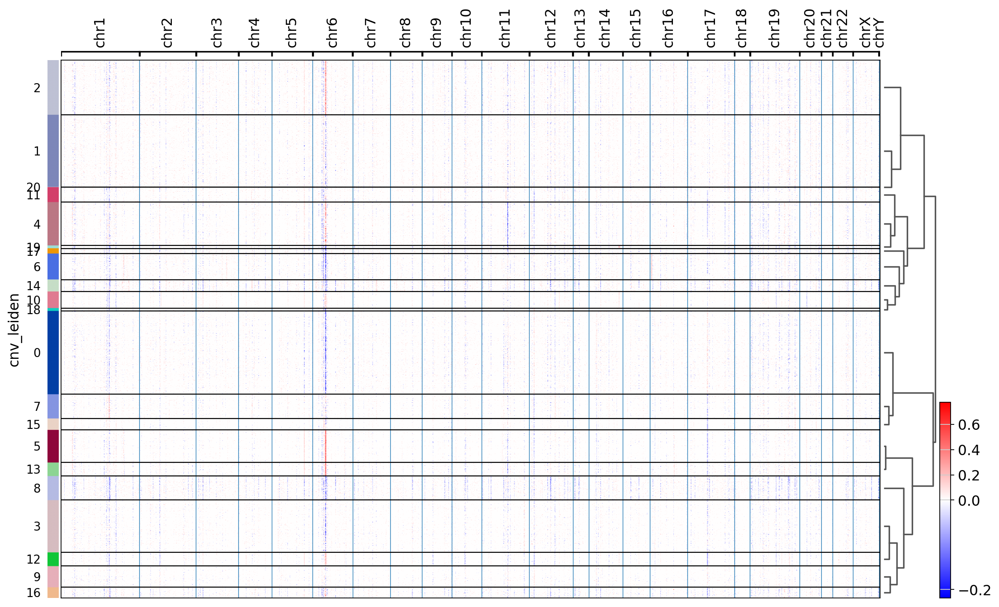

In [45]:
cnv.pl.chromosome_heatmap(adata_annotated, groupby="cnv_leiden", dendrogram=True)

... storing 'chromosome' as categorical


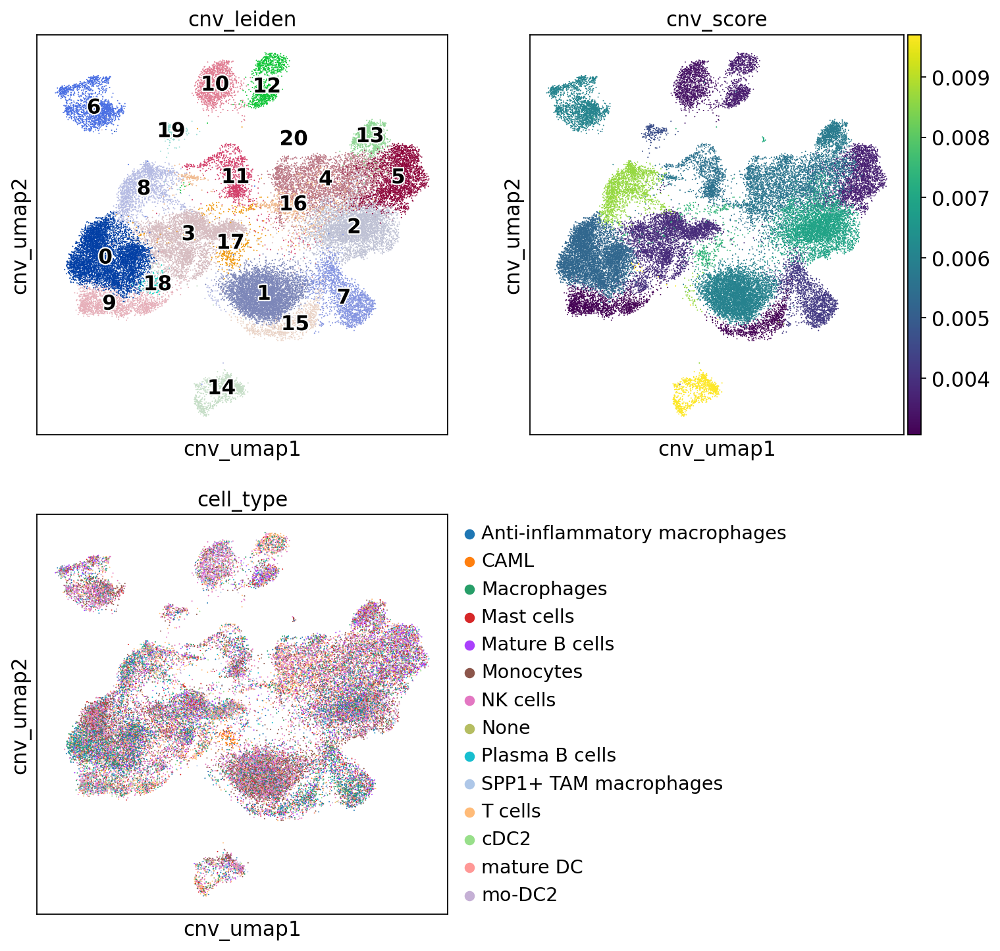

In [26]:
cnv.tl.umap(adata_annotated)
cnv.tl.cnv_score(adata_annotated)

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(11, 11))
ax4.axis("off")
cnv.pl.umap(
    adata_annotated,
    color="cnv_leiden",
    legend_loc="on data",
    legend_fontoutline=2,
    ax=ax1,
    show=False,
)
cnv.pl.umap(adata_annotated, color="cnv_score", ax=ax2, show=False)
cnv.pl.umap(adata_annotated, color="cell_type", ax=ax3)


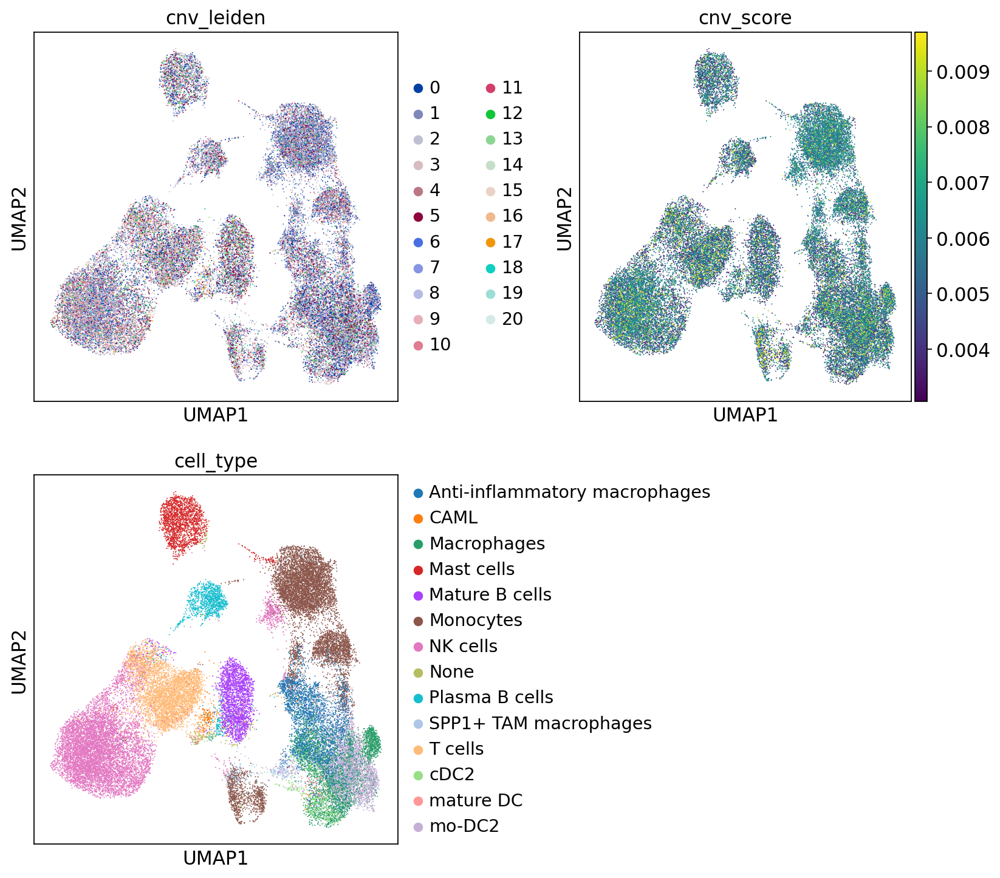

<Figure size 400x400 with 0 Axes>

In [27]:
output_path = os.path.join(graphics_path, "CNV", "CNV_Scores_full.pdf")

with PdfPages(output_path) as pdf:
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 11), gridspec_kw={"wspace": 0.5})
    ax4.axis("off")
    sc.pl.umap(adata_annotated, color="cnv_leiden", ax=ax1, show=False)
    sc.pl.umap(adata_annotated, color="cnv_score", ax=ax2, show=False)
    sc.pl.umap(adata_annotated, color="cell_type", ax=ax3)
    
    plt.tight_layout()
    pdf.savefig(fig)
    plt.close(fig) 


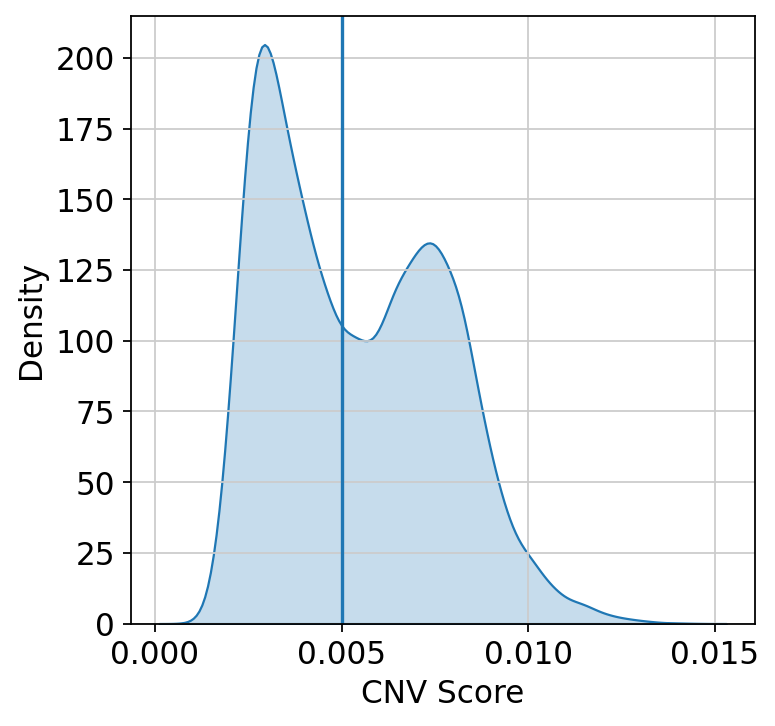

In [52]:
cnv_matrix = adata_annotated.obsm["X_cnv"].toarray()

cnv_scores_mean = np.mean(np.abs(cnv_matrix), axis=1)

adata_annotated.obs["cnv_score_mean"] = cnv_scores_mean

sns.kdeplot(data=adata_annotated.obs, x="cnv_score_mean", fill=True)
plt.xlabel("CNV Score")
plt.axvline(x=0.0050)

plt.savefig(os.path.join(graphics_path, "CNV", "CNV_Scores_threshhold.png"))
plt.show()

In [47]:
# Classify cells based on CNV score

adata_annotated.obs["cnv_status"] = np.where(
    adata_annotated.obs["cnv_score_mean"] < 0.0050, "normal", "tumor")

print(adata_annotated.obs["cnv_status"].value_counts())


cnv_status
tumor     19893
normal    19202
Name: count, dtype: int64


... storing 'cnv_status' as categorical


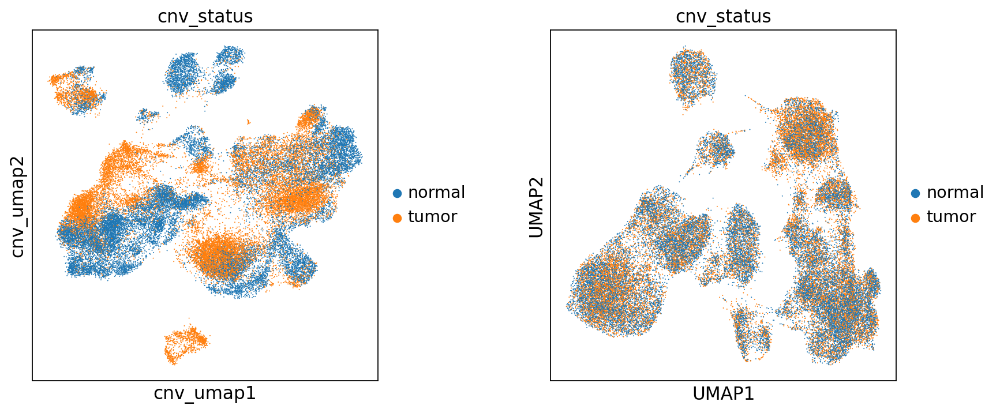

In [36]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), gridspec_kw={"wspace": 0.5})
cnv.pl.umap(adata_annotated, color="cnv_status", ax=ax1, show=False)
sc.pl.umap(adata_annotated, color="cnv_status", ax=ax2)

In [50]:
adata_annotated.write(os.path.join(data_path, "adata_cnv_full.h5ad"))

... storing 'cnv_status' as categorical


... storing 'cnv_status' as categorical


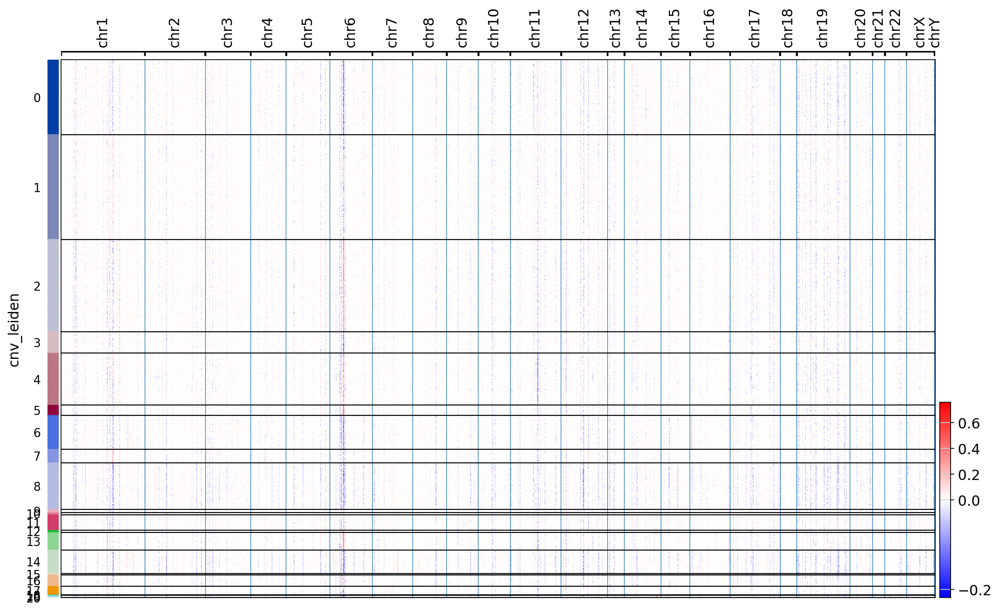

In [48]:
# Now, we can plot the CNV heatmap for tumor and normal cells separately:

cnv.pl.chromosome_heatmap(adata_annotated[adata_annotated.obs["cnv_status"] == "tumor", :])

... storing 'cnv_status' as categorical


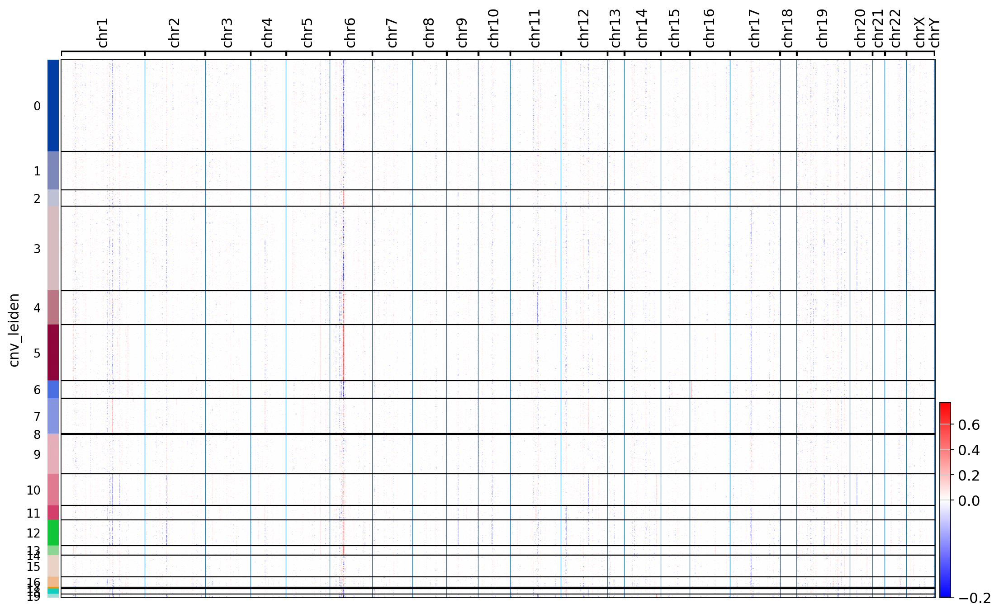

In [49]:
cnv.pl.chromosome_heatmap(adata_annotated[adata_annotated.obs["cnv_status"] == "normal", :])